In [0]:
import numpy as np  
import pandas as pd 
!conda install -c conda-forge folium=0.5.0 --yes
import folium
!conda install -c conda-forge geopy --yes 
from geopy.geocoders import Nominatim 
import matplotlib.cm as cm
import matplotlib.colors as colors
from sklearn.cluster import KMeans
import plotly.express as px
from urllib.request import urlopen
from pandas.io.json import json_normalize
import json
import requests 
from shapely.geometry import shape, Point
import seaborn as sns
import matplotlib.pyplot as plt
from folium import IFrame

/bin/bash: conda: command not found
/bin/bash: conda: command not found


In [0]:
# Load Taipei GeoJSON file

with urlopen('https://raw.githubusercontent.com/littlebtc/geodata4appy/master/simplified/taipei.geojson') as response:
    tp = json.load(response)

In [0]:
# Check on map 
address = 'Taipei'

geolocator = Nominatim(user_agent="tp_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude

tp_map = folium.Map(location=[latitude, longitude], zoom_start=12)

folium.GeoJson(
    tp,
    name='geojson'
).add_to(tp_map)

tp_map

In [0]:
# Check in dataframe
df_tp = json_normalize(tp['features'])

# Rename column names for later use
df_tp.rename(columns={'properties.TVNAME':'dist_neigh', 
                      'properties.PNAME':'city',
                      'properties.TNAME':'dist',
                      'properties.VNAME':'neigh'
                      }, 
             inplace=True)

df_tp.tail()

,type,properties.AREA,properties.PERIMETER,properties.ROADLC_,properties.ROADLC_ID,properties.X,properties.Y,properties.ID,properties.SECT_NAME,properties.SECT_CODE,properties.LIE_NAME,properties.LIE_CODE,properties.NEW,properties.FULL,properties.PERF_ID,properties.COUN_ID,properties.CPID,properties.CPTID,properties.CPTVID,properties.NPID,properties.NPTID,properties.NPTVID,city,dist,neigh,properties.PTVNAME,properties.PTNAME,dist_neigh,properties.TM2_MAX_X,properties.TM2_MAX_Y,properties.TM2_MIN_X,properties.TM2_MIN_Y,properties.MAX_X,properties.MAX_Y,properties.MIN_X,properties.MIN_Y,geometry.type,geometry.coordinates
451,Feature,1.639829e+06,5318.35056,549,0,295842.75847,2.779533e+06,452,北投區,6301200,關渡里,6301200038,6301200038,臺北市北投區關渡里,63012,6301200,63012,6301200,6301200038,63012,6301200,6301200038,臺北市,北投區,關渡里,臺北市北投區關渡里,臺北市北投區,北投區關渡里,297099.432,2779813.15,295437.100,2778313.46,None,None,None,None,Polygon,"[[[121.47524654722255, 25.11152509261945], [12..."
452,Feature,5.026598e+06,10374.61640,16,0,301984.68653,2.783823e+06,453,北投區,6301200,泉源里,6301200039,6301200039,臺北市北投區泉源里,63012,6301200,63012,6301200,6301200039,63012,6301200,6301200039,臺北市,北投區,泉源里,臺北市北投區泉源里,臺北市北投區,北投區泉源里,303059.481,2784576.07,300184.420,2781760.22,None,None,None,None,Polygon,"[[[121.51901730681959, 25.167037042434373], [1..."
453,Feature,3.751826e+06,10167.89738,22,0,303507.85843,2.783742e+06,454,北投區,6301200,湖山里,6301200040,6301200040,臺北市北投區湖山里,63012,6301200,63012,6301200,6301200040,63012,6301200,6301200040,臺北市,北投區,湖山里,臺北市北投區湖山里,臺北市北投區,北投區湖山里,304993.862,2784044.85,302452.758,2781140.48,None,None,None,None,Polygon,"[[[121.5306703593556, 25.135979376149333], [12..."
454,Feature,4.348124e+06,10568.44820,10,0,299830.37676,2.784573e+06,455,北投區,6301200,大屯里,6301200041,6301200041,臺北市北投區大屯里,63012,6301200,63012,6301200,6301200041,63012,6301200,6301200041,臺北市,北投區,大屯里,臺北市北投區大屯里,臺北市北投區,北投區大屯里,301518.021,2785396.84,298940.127,2782077.47,None,None,None,None,Polygon,"[[[121.51903822267445, 25.169611250406824], [1..."
455,Feature,1.632663e+07,20760.09073,2,0,305319.06600,2.787011e+06,456,北投區,6301200,湖田里,6301200042,6301200042,臺北市北投區湖田里,63012,6301200,63012,6301200,6301200042,63012,6301200,6301200042,臺北市,北投區,湖田里,臺北市北投區湖田里,臺北市北投區,北投區湖田里,306973.245,2789383.30,301490.096,2783263.35,None,None,None,None,Polygon,"[[[121.57353637210682, 25.193953971326454], [1..."


In [0]:
df_tp.shape

(456, 40)

In [0]:
# Functions to find the centroid of a polygon in GeoJSON file
# Credited to brandonxiang/geojson-python-utils: https://github.com/brandonxiang/geojson-python-utils/blob/develop/README_CN.md

def centroid(poly):
    """
    get the centroid of polygon
    adapted from http://paulbourke.net/geometry/polyarea/javascript.txt
    Keyword arguments:
    poly -- polygon geojson object
    return polygon centroid
    """
    f_total = 0
    x_total = 0
    y_total = 0
    # TODO: polygon holes at coordinates[1]
    points = poly['coordinates'][0]
    j = len(points) - 1
    count = len(points)

    for i in range(0, count):
        p1_x = points[i][1]
        p1_y = points[i][0]
        p2_x = points[j][1]
        p2_y = points[j][0]

        f_total = p1_x * p2_y - p2_x * p1_y
        x_total += (p1_x + p2_x) * f_total
        y_total += (p1_y + p2_y) * f_total
        j = i

    six_area = area(poly) * 6
    return {'type': 'Point', 'coordinates': [y_total / six_area, x_total / six_area]}

def area(poly):
    """
    calculate the area of polygon
    Keyword arguments:
    poly -- polygon geojson object
    return polygon area
    """
    poly_area = 0
    # TODO: polygon holes at coordinates[1]
    points = poly['coordinates'][0]
    j = len(points) - 1
    count = len(points)

    for i in range(0, count):
        p1_x = points[i][1]
        p1_y = points[i][0]
        p2_x = points[j][1]
        p2_y = points[j][0]

        poly_area += p1_x * p2_y
        poly_area -= p1_y * p2_x
        j = i

    poly_area /= 2
    return poly_area

In [0]:
# Find centroid of the first neighborhoods

box = tp['features'][0]['geometry']

center = centroid(box)

print(center['coordinates'])

[121.56378008414076, 25.070697897860242]


In [0]:
# Find centroid of every neighborhood and add the laitudes and longitudes to new columns 

tp_lon = []
tp_lat = []

for i in range(456):
  box = tp['features'][i]['geometry']
  center = centroid(box)
  tp_lon.append(center['coordinates'][0])
  tp_lat.append(center['coordinates'][1])

df_tp['Latitude'] = tp_lat
df_tp['Longitude'] = tp_lon

df_tp.tail()

,type,properties.AREA,properties.PERIMETER,properties.ROADLC_,properties.ROADLC_ID,properties.X,properties.Y,properties.ID,properties.SECT_NAME,properties.SECT_CODE,properties.LIE_NAME,properties.LIE_CODE,properties.NEW,properties.FULL,properties.PERF_ID,properties.COUN_ID,properties.CPID,properties.CPTID,properties.CPTVID,properties.NPID,properties.NPTID,properties.NPTVID,city,dist,neigh,properties.PTVNAME,properties.PTNAME,dist_neigh,properties.TM2_MAX_X,properties.TM2_MAX_Y,properties.TM2_MIN_X,properties.TM2_MIN_Y,properties.MAX_X,properties.MAX_Y,properties.MIN_X,properties.MIN_Y,geometry.type,geometry.coordinates,Latitude,Longitude
451,Feature,1.639829e+06,5318.35056,549,0,295842.75847,2.779533e+06,452,北投區,6301200,關渡里,6301200038,6301200038,臺北市北投區關渡里,63012,6301200,63012,6301200,6301200038,63012,6301200,6301200038,臺北市,北投區,關渡里,臺北市北投區關渡里,臺北市北投區,北投區關渡里,297099.432,2779813.15,295437.100,2778313.46,None,None,None,None,Polygon,"[[[121.47524654722255, 25.11152509261945], [12...",25.117710,121.467772
452,Feature,5.026598e+06,10374.61640,16,0,301984.68653,2.783823e+06,453,北投區,6301200,泉源里,6301200039,6301200039,臺北市北投區泉源里,63012,6301200,63012,6301200,6301200039,63012,6301200,6301200039,臺北市,北投區,泉源里,臺北市北投區泉源里,臺北市北投區,北投區泉源里,303059.481,2784576.07,300184.420,2781760.22,None,None,None,None,Polygon,"[[[121.51901730681959, 25.167037042434373], [1...",25.153236,121.520774
453,Feature,3.751826e+06,10167.89738,22,0,303507.85843,2.783742e+06,454,北投區,6301200,湖山里,6301200040,6301200040,臺北市北投區湖山里,63012,6301200,63012,6301200,6301200040,63012,6301200,6301200040,臺北市,北投區,湖山里,臺北市北投區湖山里,臺北市北投區,北投區湖山里,304993.862,2784044.85,302452.758,2781140.48,None,None,None,None,Polygon,"[[[121.5306703593556, 25.135979376149333], [12...",25.149328,121.539538
454,Feature,4.348124e+06,10568.44820,10,0,299830.37676,2.784573e+06,455,北投區,6301200,大屯里,6301200041,6301200041,臺北市北投區大屯里,63012,6301200,63012,6301200,6301200041,63012,6301200,6301200041,臺北市,北投區,大屯里,臺北市北投區大屯里,臺北市北投區,北投區大屯里,301518.021,2785396.84,298940.127,2782077.47,None,None,None,None,Polygon,"[[[121.51903822267445, 25.169611250406824], [1...",25.160564,121.505817
455,Feature,1.632663e+07,20760.09073,2,0,305319.06600,2.787011e+06,456,北投區,6301200,湖田里,6301200042,6301200042,臺北市北投區湖田里,63012,6301200,63012,6301200,6301200042,63012,6301200,6301200042,臺北市,北投區,湖田里,臺北市北投區湖田里,臺北市北投區,北投區湖田里,306973.245,2789383.30,301490.096,2783263.35,None,None,None,None,Polygon,"[[[121.57353637210682, 25.193953971326454], [1...",25.179281,121.547548


In [0]:
# Check centroids on map
for lat, lng, dist, neigh in zip(df_tp['Latitude'], df_tp['Longitude'], df_tp['dist'], df_tp['neigh']):
    popup = '{}, {}'.format(dist, neigh)
    popup = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius = 5,
        popup = popup,
        color = 'blue',
        fill = True,
        fill_color = '#3186cc',
        fill_opacity = 0.7,
        parse_html = False).add_to(tp_map)  

folium.LayerControl().add_to(tp_map)

tp_map

'&#33274;&#21271;&#24066;&#21271;&#25237;&#21312;&#38364;&#28193;&#37324;'

In [0]:
# Solve encoding problem, credited to: https://yafei777.github.io/Yafei-blog/blog/folium-popup/
def utf2asc(s):
    return str(str(s).encode('ascii', 'xmlcharrefreplace'))[2:-1]

# Add labels for each neighborhoods 
def add_label():
  paragraph = """<p>{}</p>""".format

  for lat, lng, dist, neigh in zip(df_tp['Latitude'], df_tp['Longitude'], df_tp['dist'], df_tp['neigh']):
    label = '{}, {}'.format(dist, neigh)
    iframe = IFrame(html = paragraph(utf2asc(label)),
                width=100,
                height=50)
    popup = folium.Popup(iframe)
    folium.CircleMarker(
        [lat, lng],
        radius = 3,
        popup = popup,
        color = 'blue',
        fill = True,
        fill_color = '#3186cc',
        fill_opacity = 0.7,
        parse_html = False).add_to(map)  

  return map

In [0]:
# Read Taipei household income data

income = pd.read_excel('https://github.com/dubidub/Coursera_Capstone/raw/master/Taiwan%20neighborhoods%20income.xlsx')
income.rename(columns={'鄉鎮市區':'dist', 
                       '村里':'neigh',
                       '中位數':'income_median'},
              inplace=True)

income.sort_values('income_median', ascending=False)

,dist,neigh,納稅單位,綜合所得總額,平均數,income_median,第一分位數,第三分位數,標準差,變異係數
274,文山區,政大里,2082,3849431,1849,1274,566,2298,2538.71,137.31
332,內湖區,金湖里,3235,7463148,2307,1273,590,2660,4370.45,189.44
337,內湖區,寶湖里,2729,5519458,2023,1183,546,2455,2948.99,145.81
199,中山區,成功里,2460,6788058,2759,1179,542,2545,8502.27,308.12
297,南港區,重陽里,1527,2662941,1744,1146,570,2163,2158.01,123.75
...,...,...,...,...,...,...,...,...,...,...
159,萬華區,其 他,262,190674,728,484,299,875,856.02,117.62
392,士林區,其 他,357,292299,819,484,265,889,1124.60,137.35
231,中山區,其 他,133,173125,1302,470,300,858,4033.24,309.85
436,北投區,其 他,151,111765,740,443,302,820,930.25,125.68


In [0]:
# Merge income with df_tp

# Create the merge key for both df
income["dist_neigh"] = income["dist"] + income["neigh"]

# Then merge 
df_tp1 = pd.merge(df_tp, income, on = 'dist_neigh')

In [0]:
df_tp1.head()

,type,properties.AREA,properties.PERIMETER,properties.ROADLC_,properties.ROADLC_ID,properties.X,properties.Y,properties.ID,properties.SECT_NAME,properties.SECT_CODE,properties.LIE_NAME,properties.LIE_CODE,properties.NEW,properties.FULL,properties.PERF_ID,properties.COUN_ID,properties.CPID,properties.CPTID,properties.CPTVID,properties.NPID,properties.NPTID,properties.NPTVID,city,dist_x,neigh_x,properties.PTVNAME,properties.PTNAME,dist_neigh,properties.TM2_MAX_X,properties.TM2_MAX_Y,properties.TM2_MIN_X,properties.TM2_MIN_Y,properties.MAX_X,properties.MAX_Y,properties.MIN_X,properties.MIN_Y,geometry.type,geometry.coordinates,Latitude,Longitude,dist_y,neigh_y,納稅單位,綜合所得總額,平均數,income_median,第一分位數,第三分位數,標準差,變異係數
0,Feature,1.281570e+06,7845.48419,2528,0,305274.35890,2.774201e+06,1,松山區,6300100,莊敬里,6300100002,6300100002,臺北市松山區莊敬里,63001,6300100,63001,6300100,6300100002,63001,6300100,6300100002,臺北市,松山區,莊敬里,臺北市松山區莊敬里,臺北市松山區,松山區莊敬里,306872.396,2774513.48,304646.856,2773070.43,None,None,None,None,Polygon,"[[[121.568241977504, 25.06361509900047], [121....",25.070698,121.563780,松山區,莊敬里,1799,1660407,923,688,379,1215,863.32,93.54
1,Feature,2.593486e+05,2158.12973,3369,0,305536.83356,2.772927e+06,2,松山區,6300100,東榮里,6300100003,6300100003,臺北市松山區東榮里,63001,6300100,63001,6300100,6300100003,63001,6300100,6300100003,臺北市,松山區,東榮里,臺北市松山區東榮里,臺北市松山區,松山區東榮里,305826.480,2773016.54,305121.928,2772546.69,None,None,None,None,Polygon,"[[[121.55522488875263, 25.05830471637191], [12...",25.060350,121.558050,松山區,東榮里,3069,5400462,1760,919,422,1934,4626.98,262.94
2,Feature,1.345430e+05,1906.84462,3333,0,305835.64963,2.772981e+06,3,松山區,6300100,三民里,6300100004,6300100004,臺北市松山區三民里,63001,6300100,63001,6300100,6300100004,63001,6300100,6300100004,臺北市,松山區,三民里,臺北市松山區三民里,臺北市松山區,松山區三民里,306034.751,2773058.88,305685.570,2772383.59,None,None,None,None,Polygon,"[[[121.56338315443298, 25.058948202358533], [1...",25.060024,121.562244,松山區,三民里,2540,3652162,1438,800,396,1602,3650.89,253.91
3,Feature,1.151300e+05,1552.06662,3297,0,306387.36347,2.773104e+06,4,松山區,6300100,新益里,6300100005,6300100005,臺北市松山區新益里,63001,6300100,63001,6300100,6300100005,63001,6300100,6300100005,臺北市,松山區,新益里,臺北市松山區新益里,臺北市松山區,松山區新益里,306576.763,2773140.36,306172.861,2772665.41,None,None,None,None,Polygon,"[[[121.56558597522833, 25.06053445893116], [12...",25.061795,121.567122,松山區,新益里,1710,1835397,1073,714,390,1349,1328.28,123.75
4,Feature,9.981312e+04,1351.73546,3320,0,306152.31677,2.773055e+06,5,松山區,6300100,富錦里,6300100006,6300100006,臺北市松山區富錦里,63001,6300100,63001,6300100,6300100006,63001,6300100,6300100006,臺北市,松山區,富錦里,臺北市松山區富錦里,臺北市松山區,松山區富錦里,306268.441,2773089.68,305977.061,2772621.37,None,None,None,None,Polygon,"[[[121.56338315443298, 25.058948202358533], [1...",25.060958,121.564352,松山區,富錦里,1855,2711635,1462,749,393,1476,6546.88,447.86


In [0]:
# Read Taiwan neighborhoods population data

ppl = pd.read_csv('https://github.com/dubidub/Coursera_Capstone/raw/master/Taiwan%20neighborhoods%20population.csv')


# Sum up populaion under 15
ppl.rename(columns={'區域別':'city_dist', '村里':'neigh', '中位數':'median', 
                    '0歲-男':'m0', '0歲-女':'f0', '1歲-男':'m1', 
                    '1歲-女':'f1', '2歲-男':'m2', '2歲-女':'f2', 
                    '3歲-男':'m3', '3歲-女':'f3', '4歲-男':'m4', 
                    '4歲-女':'f4', '5歲-男':'m5', '5歲-女':'f5',
                    '6歲-男':'m6', '6歲-女':'f6', '7歲-男':'m7', 
                    '7歲-女':'f7', '8歲-男':'m8', '8歲-女':'f8',
                    '9歲-男':'m9', '9歲-女':'f9', '10歲-男':'m10',
                    '10歲-女':'f10', '11歲-男':'m11', '11歲-女':'f11',
                    '12歲-男':'m12', '12歲-女':'f12', '13歲-男':'m13',
                    '13歲-女':'f13', '14歲-男':'m14', '14歲-女':'f14',
                    '15歲-男':'m15', '15歲-女':'f15'
                    },
              inplace=True)

ppl['under_15'] = ppl.m0 + ppl.m1 + ppl.m2 + ppl.m3 + ppl.m4 + ppl.m5 + ppl.m6 \
                  + ppl.m7 + ppl.m8 + ppl.m9 + ppl.m10 + ppl.m11 + ppl.m12 + \
                  ppl.m13 + ppl.m14 + ppl.m15 + ppl.f0 + ppl.f1 + ppl.f2 + \
                  ppl.f3 + ppl.f4 + ppl.f5 + ppl.f6 + ppl.f7 + ppl.f8 + ppl.f9 \
                  + ppl.f10 + ppl.f11 + ppl.f12 + ppl.f13 + ppl.f14 + ppl.f15

In [0]:
# Merge ppl with df_tp1

# Create the merge key for both df
ppl["city_dist_neigh"] = ppl["city_dist"] + ppl["neigh"]
df_tp1.rename(columns={'properties.PTVNAME':'city_dist_neigh'}, inplace=True)

# Then merge 
df_tp2 = pd.merge(df_tp1, ppl, on = 'city_dist_neigh')

df_tp2.head()

,type,properties.AREA,properties.PERIMETER,properties.ROADLC_,properties.ROADLC_ID,properties.X,properties.Y,properties.ID,properties.SECT_NAME,properties.SECT_CODE,properties.LIE_NAME,properties.LIE_CODE,properties.NEW,properties.FULL,properties.PERF_ID,properties.COUN_ID,properties.CPID,properties.CPTID,properties.CPTVID,properties.NPID,properties.NPTID,properties.NPTVID,city,dist_x,neigh_x,city_dist_neigh,properties.PTNAME,dist_neigh,properties.TM2_MAX_X,properties.TM2_MAX_Y,properties.TM2_MIN_X,properties.TM2_MIN_Y,properties.MAX_X,properties.MAX_Y,properties.MIN_X,properties.MIN_Y,geometry.type,geometry.coordinates,Latitude,Longitude,...,81歲-女,82歲-男,82歲-女,83歲-男,83歲-女,84歲-男,84歲-女,85歲-男,85歲-女,86歲-男,86歲-女,87歲-男,87歲-女,88歲-男,88歲-女,89歲-男,89歲-女,90歲-男,90歲-女,91歲-男,91歲-女,92歲-男,92歲-女,93歲-男,93歲-女,94歲-男,94歲-女,95歲-男,95歲-女,96歲-男,96歲-女,97歲-男,97歲-女,98歲-男,98歲-女,99歲-男,99歲-女,100歲以上-男,100歲以上-女,under_15
0,Feature,1.281570e+06,7845.48419,2528,0,305274.35890,2.774201e+06,1,松山區,6300100,莊敬里,6300100002,6300100002,臺北市松山區莊敬里,63001,6300100,63001,6300100,6300100002,63001,6300100,6300100002,臺北市,松山區,莊敬里,臺北市松山區莊敬里,臺北市松山區,松山區莊敬里,306872.396,2774513.48,304646.856,2773070.43,None,None,None,None,Polygon,"[[[121.568241977504, 25.06361509900047], [121....",25.070698,121.563780,...,16,10,9,14,15,12,10,15,10,15,4,9,7,10,5,8,8,3,7,3,2,4,4,2,1,2,0,0,1,1,3,1,0,1,0,0,0,0,0,753
1,Feature,2.593486e+05,2158.12973,3369,0,305536.83356,2.772927e+06,2,松山區,6300100,東榮里,6300100003,6300100003,臺北市松山區東榮里,63001,6300100,63001,6300100,6300100003,63001,6300100,6300100003,臺北市,松山區,東榮里,臺北市松山區東榮里,臺北市松山區,松山區東榮里,305826.480,2773016.54,305121.928,2772546.69,None,None,None,None,Polygon,"[[[121.55522488875263, 25.05830471637191], [12...",25.060350,121.558050,...,16,14,25,17,13,15,11,8,18,13,11,3,17,3,11,8,13,5,12,5,4,5,2,4,7,5,3,0,3,2,3,1,1,1,0,0,0,0,0,1476
2,Feature,1.345430e+05,1906.84462,3333,0,305835.64963,2.772981e+06,3,松山區,6300100,三民里,6300100004,6300100004,臺北市松山區三民里,63001,6300100,63001,6300100,6300100004,63001,6300100,6300100004,臺北市,松山區,三民里,臺北市松山區三民里,臺北市松山區,松山區三民里,306034.751,2773058.88,305685.570,2772383.59,None,None,None,None,Polygon,"[[[121.56338315443298, 25.058948202358533], [1...",25.060024,121.562244,...,15,16,11,17,12,11,20,15,7,11,14,4,10,17,19,7,8,15,9,8,5,5,3,9,4,2,1,4,3,1,1,2,1,2,1,1,0,0,6,1045
3,Feature,1.151300e+05,1552.06662,3297,0,306387.36347,2.773104e+06,4,松山區,6300100,新益里,6300100005,6300100005,臺北市松山區新益里,63001,6300100,63001,6300100,6300100005,63001,6300100,6300100005,臺北市,松山區,新益里,臺北市松山區新益里,臺北市松山區,松山區新益里,306576.763,2773140.36,306172.861,2772665.41,None,None,None,None,Polygon,"[[[121.56558597522833, 25.06053445893116], [12...",25.061795,121.567122,...,11,7,5,7,11,4,10,6,8,8,9,6,8,4,8,7,5,5,2,3,5,1,4,1,4,0,2,1,0,0,2,0,1,0,1,0,0,2,0,621
4,Feature,9.981312e+04,1351.73546,3320,0,306152.31677,2.773055e+06,5,松山區,6300100,富錦里,6300100006,6300100006,臺北市松山區富錦里,63001,6300100,63001,6300100,6300100006,63001,6300100,6300100006,臺北市,松山區,富錦里,臺北市松山區富錦里,臺北市松山區,松山區富錦里,306268.441,2773089.68,305977.061,2772621.37,None,None,None,None,Polygon,"[[[121.56338315443298, 25.058948202358533], [1...",25.060958,121.564352,...,16,7,15,9,6,5,7,10,5,7,6,6,7,11,6,9,5,4,7,3,3,0,1,1,1,1,0,2,1,0,0,0,0,0,0,0,0,0,0,806


In [0]:
df_tp3 = df_tp2.loc[:, ['dist_neigh', 'Latitude', 'Longitude', 'under_15', 'income_median']]
df_tp3.rename(columns={'properties.TVNAME':'dist_neigh', 
                      'properties.PNAME':'city',
                      'properties.TNAME':'dist',
                      'properties.VNAME':'neigh'
                      }, 
             inplace=True)

In [0]:
df_tp3.shape

(451, 5)

In [0]:
# Find the missing values
missing = pd.merge(df_tp3, df_tp, on='dist_neigh', how='outer')
missing['dist_neigh'].loc[missing['Latitude_x'].isnull()]

451    信義區富台里
452    大安區群賢里
453    大安區群英里
454    萬華區糖蔀里
455    南港區舊莊里
Name: dist_neigh, dtype: object

In [0]:
df_tp3['under_15'].describe()

count     451.000000
mean      893.572062
std       424.162245
min       101.000000
25%       603.500000
50%       810.000000
75%      1115.000000
max      2703.000000
Name: under_15, dtype: float64

In [0]:
df_tp3['income_median'].describe()

count     451.000000
mean      735.609756
std       127.330046
min       512.000000
25%       641.000000
50%       714.000000
75%       797.000000
max      1274.000000
Name: income_median, dtype: float64

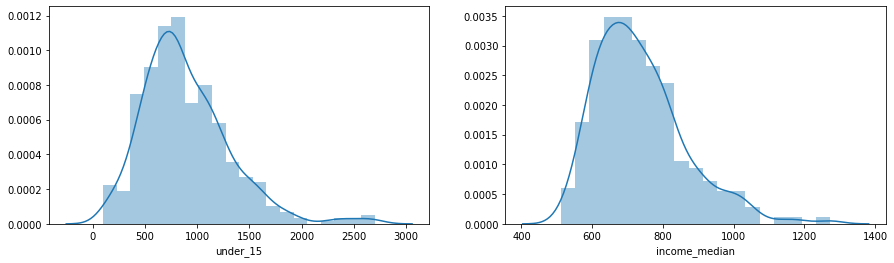

In [0]:
fig, axs = plt.subplots(ncols=2)
fig.set_figwidth(15)
sns.distplot(df_tp3['under_15'], ax=axs[0])
sns.distplot(df_tp3['income_median'], ax=axs[1])

In [0]:
# Show income on map

map = folium.Map(location=[latitude, longitude], zoom_start=12)

folium.Choropleth(
    geo_data = tp,
    name = 'Taipei Household income',
    data = df_tp3,
    columns = ['dist_neigh', 'income_median'],
    key_on = 'properties.TVNAME',
    fill_color = 'YlGn',
    fill_opacity = 0.7,
    line_opacity = 0.2,
    legend_name = 'Household Income').add_to(map)

add_label()

map

In [0]:
# Show ppl on map

map = folium.Map(location=[latitude, longitude], zoom_start=12)

folium.Choropleth(
    geo_data = tp,
    name = 'under 15 population',
    data = df_tp3,
    columns = ['dist_neigh', 'income_median'],
    key_on = 'properties.TVNAME',
    fill_color = 'BuPu',
    fill_opacity = 0.7,
    line_opacity = 0.2,
    legend_name = 'Population').add_to(map)

add_label()

map

# Use Foursquare API to get accessible education resources

In [0]:
# Foursquare API
# Add categoryId to limit the search results

def getNearbyVenues(names, latitudes, longitudes, radius = 1500, LIMIT = 100):
    
    cat_Id = '4bf58dd8d48988d13b941735,4bf58dd8d48988d12f941735,4bf58dd8d48988d181941735'
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)

        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&categoryId={}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            cat_Id,
            radius, 
            LIMIT)
            
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        venues_list.append([(name,
                             v['venue']['id'],
                             v['venue']['name'],
                             v['venue']['location']['lat'], 
                             v['venue']['location']['lng'], 
                             v['venue']['categories'][0]['name'],
                             v['venue']['categories'][0]['id']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighbourhood', 
                             'venue_id', 
                             'venue_name',
                             'venue_latitude', 
                             'venue_longitude', 
                             'venue_category_name', 
                             'venue_category_id']
    
    return(nearby_venues)

In [0]:
# Foursquare credential
CLIENT_ID = '-----' 
CLIENT_SECRET = '-----' 
VERSION = '20180605' # Foursquare API version

In [0]:
# Get a list of venue categories 
url = 'https://api.foursquare.com/v2/venues/categories?&client_id={}&client_secret={}&v={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            )
venue_cat = requests.get(url).json()

In [0]:
results['response']['categories']

In [0]:
# Create a category of education resources 
# link: https://developer.foursquare.com/docs/build-with-foursquare/categories/

edu = [['School', '4bf58dd8d48988d13b941735'],
       ['Library', '4bf58dd8d48988d12f941735'], 
       ['Museum', '4bf58dd8d48988d181941735']
       ] 

edu = pd.DataFrame(edu, columns = ['categoryName', 'categoryId']) 
  
edu

,categoryName,categoryId
0,School,4bf58dd8d48988d13b941735
1,Library,4bf58dd8d48988d12f941735
2,Museum,4bf58dd8d48988d181941735


In [0]:
cat_Id = ','.join(map(str, edu['categoryId']))
cat_Id

'4bf58dd8d48988d13b941735,4bf58dd8d48988d12f941735,4bf58dd8d48988d181941735'

In [0]:
# Check venues using Foursquare API

tp_venues = getNearbyVenues(names = df_tp3['dist_neigh'],
                            latitudes = df_tp3['Latitude'],
                            longitudes = df_tp3['Longitude']
                            )
tp_venues.shape

松山區莊敬里
松山區東榮里
松山區三民里
松山區新益里
松山區富錦里
松山區新東里
松山區富泰里
松山區介壽里
松山區精忠里
松山區東光里
松山區龍田里
松山區東昌里
松山區東勢里
松山區中華里
松山區民有里
松山區民福里
松山區慈祐里
松山區安平里
松山區鵬程里
松山區自強里
松山區吉祥里
松山區新聚里
松山區復盛里
松山區中正里
松山區中崙里
松山區美仁里
松山區吉仁里
松山區敦化里
松山區復源里
松山區復建里
松山區復勢里
松山區福成里
松山區松基里
信義區西村里
信義區正和里
信義區興隆里
信義區中興里
信義區新仁里
信義區興雅里
信義區敦厚里
信義區廣居里
信義區安康里
信義區六藝里
信義區雅祥里
信義區五常里
信義區五全里
信義區永吉里
信義區長春里
信義區四育里
信義區四維里
信義區永春里
信義區國業里
信義區松隆里
信義區松友里
信義區松光里
信義區中坡里
信義區中行里
信義區大道里
信義區大仁里
信義區景新里
信義區惠安里
信義區三張里
信義區三犁里
信義區六合里
信義區泰和里
信義區景聯里
信義區景勤里
信義區雙和里
信義區嘉興里
信義區黎順里
信義區黎平里
信義區黎忠里
信義區黎安里
大安區德安里
大安區仁慈里
大安區和安里
大安區民炤里
大安區仁愛里
大安區義村里
大安區民輝里
大安區昌隆里
大安區誠安里
大安區光武里
大安區龍坡里
大安區龍泉里
大安區古風里
大安區古莊里
大安區龍安里
大安區錦安里
大安區福住里
大安區永康里
大安區光明里
大安區錦泰里
大安區錦華里
大安區龍圖里
大安區新龍里
大安區龍陣里
大安區龍雲里
大安區龍生里
大安區住安里
大安區義安里
大安區通化里
大安區通安里
大安區臨江里
大安區法治里
大安區全安里
大安區虎嘯里
大安區臥龍里
大安區龍淵里
大安區龍門里
大安區大學里
大安區芳和里
大安區黎元里
大安區黎孝里
大安區黎和里
大安區建安里
大安區建倫里
大安區敦安里
大安區正聲里
大安區敦煌里
大安區華聲里
大安區車層里
大安區光信里
大安區學府里
中山區正守里
中山區正義里
中山區正得里
中山區民安里
中山區康樂里
中山區中山里
中山區聚盛里
中山區集英里
中山區聚葉里
中山區恆安里
中山區晴光里
中山區圓山里
中山區劍潭里
中山區大直里
中山區成功里
中山區永安里
中山區大佳里
中山區新喜里
中山區新庄里

(9450, 7)

In [0]:
tp_venues.head()

,Neighbourhood,venue_id,venue_name,venue_latitude,venue_longitude,venue_category_name,venue_category_id
0,松山區莊敬里,4e3794de922e67056103ae7c,學學文創志業 Xue Xue Institute,25.077817,121.567934,Community College,4bf58dd8d48988d1a2941735
1,松山區莊敬里,4bfcefeee529c9282325ba8c,臺北市立圖書館 Taipei Public Library,25.059472,121.563124,Library,4bf58dd8d48988d12f941735
2,松山區莊敬里,4eb253b0f5b94483884b11fa,Happy Marian,25.058909,121.557636,School,4bf58dd8d48988d13b941735
3,松山區莊敬里,4ec64b6fb634b2fd72f70b9f,台北市立圖書館松山機場智慧圖書館,25.063087,121.551642,Library,4bf58dd8d48988d12f941735
4,松山區莊敬里,4cd258364aa9f04dcdde56cb,臺北市立三民國民小學 Taipei Municipal SanMin Elementary ...,25.064342,121.565906,Elementary School,4f4533804b9074f6e4fb0105


In [0]:
tp_venues.venue_category_name.unique()

array(['Community College', 'Library', 'School', 'Elementary School',
       'Middle School', 'Museum', 'Memorial Site', 'High School',
       'Comedy Club', 'Nursery School', 'Art Museum', 'Public Art',
       'Café', 'Music School', 'Factory', 'Preschool', 'History Museum',
       'College Academic Building', 'Indoor Play Area',
       'Performing Arts Venue', 'Trade School', 'Medical School',
       'Monument / Landmark', 'Language School', 'College Arts Building',
       'Music Venue', 'Temple', 'Park', 'Government Building',
       'Private School', 'University', 'Church', 'Swim School',
       'Historic Site', 'Office', 'Music Store', 'Science Museum',
       'Coffee Shop', 'Driving School', 'Planetarium'], dtype=object)

In [0]:
# Refine the category and limit results to only school, library and museum 

school = tp_venues.loc[tp_venues['venue_category_name'].isin(['School', 'Elementary School', 'Middle School', 'Preschool'])]
library = tp_venues.loc[tp_venues['venue_category_name'].isin(['Library'])]
museum = tp_venues.loc[tp_venues['venue_category_name'].isin(['Museum', 'Art Museum', 'History Museum', 'Science Museum', 'Planetarium'])]

school['v_cat'] = 'School'
library['v_cat'] = 'Library'
museum['v_cat'] = 'Museum'

tp_venues1 = pd.concat([school, library, museum])
tp_venues1.head()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stabl

,Neighbourhood,venue_id,venue_name,venue_latitude,venue_longitude,venue_category_name,venue_category_id,v_cat
2,松山區莊敬里,4eb253b0f5b94483884b11fa,Happy Marian,25.058909,121.557636,School,4bf58dd8d48988d13b941735,School
4,松山區莊敬里,4cd258364aa9f04dcdde56cb,臺北市立三民國民小學 Taipei Municipal SanMin Elementary ...,25.064342,121.565906,Elementary School,4f4533804b9074f6e4fb0105,School
5,松山區莊敬里,4c81bbbe74d7b60cbe1d7ad8,台北市立民權國民小學 Taipei Municipal MinQuan Elementary...,25.062611,121.563132,Elementary School,4f4533804b9074f6e4fb0105,School
6,松山區莊敬里,4c46fd491ddec928e9f19b32,臺北市立濱江國民中學 Taipei Municipal BinJiang Junior Hi...,25.079964,121.559820,Middle School,4f4533814b9074f6e4fb0106,School
7,松山區莊敬里,4cdd91967e2e236af2b3791b,臺北市立民生國民中學 Taipei Municipal MinSheng Junior Hi...,25.059093,121.566732,Middle School,4f4533814b9074f6e4fb0106,School


In [0]:
# Remove 2000 non-relevant venues
tp_venues1.shape

(7225, 8)

In [0]:
# Check the numbers of accessible education resources of each neighborhood

tp_edu = tp_venues1.groupby('Neighbourhood')['v_cat'].value_counts().unstack(fill_value=0)
tp_edu = tp_edu.reset_index()
tp_edu['edu_Total'] = tp_edu['Library'] + tp_edu['Museum'] + tp_edu['School']
tp_edu.sort_values('edu_Total', ascending=False)

v_cat,Neighbourhood,Library,Museum,School,edu_Total
45,中正區南門里,7,18,19,44
52,中正區愛國里,7,18,19,44
71,中正區龍福里,8,15,19,42
69,中正區黎明里,7,17,17,41
57,中正區東門里,8,16,16,40
...,...,...,...,...,...
148,內湖區金瑞里,0,0,1,1
179,北投區湖田里,0,0,1,1
115,內湖區內溝里,0,1,0,1
212,士林區公館里,0,0,1,1


In [0]:
# 446 neighborhoods have access to education resources 
tp_edu.shape

(446, 5)

In [0]:
df_tp3.head()

,dist_neigh,Latitude,Longitude,under_15,income_median
0,松山區莊敬里,25.070698,121.563780,753,688
1,松山區東榮里,25.060350,121.558050,1476,919
2,松山區三民里,25.060024,121.562244,1045,800
3,松山區新益里,25.061795,121.567122,621,714
4,松山區富錦里,25.060958,121.564352,806,749


In [0]:
# Find the missing values
tp_edu1 = pd.merge(df_tp3, tp_edu, left_on = 'dist_neigh', right_on='Neighbourhood', how='outer')
tp_edu1.drop('Neighbourhood', axis=1, inplace=True)
tp_edu1.fillna(0, inplace=True)
tp_edu1.sort_values('edu_Total', ascending=False)

,dist_neigh,Latitude,Longitude,under_15,income_median,Library,Museum,School,edu_Total
181,中正區愛國里,25.034740,121.506777,786,774,7.0,18.0,19.0,44.0
182,中正區南門里,25.033464,121.510260,629,871,7.0,18.0,19.0,44.0
185,中正區龍福里,25.032835,121.515827,1705,919,8.0,15.0,19.0,42.0
189,中正區黎明里,25.044579,121.516213,731,848,7.0,17.0,17.0,41.0
200,大同區建泰里,25.051971,121.518025,689,680,4.0,18.0,18.0,40.0
...,...,...,...,...,...,...,...,...,...
404,士林區菁山里,25.162455,121.568508,198,638,0.0,0.0,0.0,0.0
405,士林區平等里,25.144997,121.579145,169,598,0.0,0.0,0.0,0.0
332,內湖區碧山里,25.101502,121.589506,1055,699,0.0,0.0,0.0,0.0
449,北投區大屯里,25.160564,121.505817,166,570,0.0,0.0,0.0,0.0


In [0]:
# Check unique venues
tp_venues2 = tp_venues1.drop('Neighbourhood', 1)
tp_venues2.drop_duplicates(inplace=True) 

tp_venues2.shape

(333, 7)

In [0]:
tp_venues2.head()

In [0]:
def add_venues(): 

  paragraph = """<p>{}</p>""".format

  for lat, lng, name, cat in zip(tp_venues2['venue_latitude'], tp_venues2['venue_longitude'], tp_venues2['venue_name'], tp_venues2['v_cat']):
    if cat == 'School':
      color = 'blue'
      icon = 'pencil'
    elif cat == 'Library': 
      color = 'green'
      icon = 'book'
    else: 
      color = 'gray'
      icon = 'home'
    label = '{}, {}'.format(name, cat)
    iframe = IFrame(html = paragraph(utf2asc(label)), width = 200, height = 100)
    popup = folium.Popup(iframe)
    folium.Marker([lat, lng], popup = popup,
                  icon = folium.Icon(icon = icon, color = color),                
                  ).add_to(map)  

  return map

In [0]:
# Check unique venue location on map

map = folium.Map(location=[latitude, longitude], zoom_start=12)

paragraph = """<p>{}</p>""".format

for lat, lng, name, cat in zip(tp_venues2['venue_latitude'], tp_venues2['venue_longitude'], tp_venues2['venue_name'], tp_venues2['v_cat']):
  if cat == 'School':
    color = 'blue'
    icon = 'pencil'
  elif cat == 'Library': 
    color = 'green'
    icon = 'book'
  else: 
    color = 'gray'
    icon = 'home'
  label = '{}, {}'.format(name, cat)
  iframe = IFrame(html = paragraph(utf2asc(label)), width = 200, height = 100)
  popup = folium.Popup(iframe)
  folium.Marker([lat, lng], popup = popup,
                icon = folium.Icon(icon = icon, color = color),                
                ).add_to(map)  

map

In [0]:
# Check neighborhoods where venues really locate

venue_loc = []

for id, venue, lat, lng in zip(tp_venues2['venue_id'], tp_venues2['venue_name'], tp_venues2['venue_latitude'], tp_venues2['venue_longitude']):
  point = Point(lng, lat)
  for feature in tp['features']:
    polygon = shape(feature['geometry'])
    if polygon.contains(point):
        venue_loc.append([id, feature['properties']['TVNAME']])

venue_loc = pd.DataFrame(venue_loc, columns = ['venue_id', 'venue_neigh']) 
  
venue_loc.head()

,venue_id,venue_neigh
0,4eb253b0f5b94483884b11fa,松山區東榮里
1,4cd258364aa9f04dcdde56cb,松山區莊敬里
2,4c81bbbe74d7b60cbe1d7ad8,松山區富錦里
3,4c46fd491ddec928e9f19b32,中山區金泰里
4,4cdd91967e2e236af2b3791b,松山區新東里


In [0]:
venue_loc.shape

(310, 2)

In [0]:
tp_venues3 = pd.merge(tp_venues2, venue_loc, on = 'venue_id')
tp_venues3.head()

,venue_id,venue_name,venue_latitude,venue_longitude,venue_category_name,venue_category_id,v_cat,venue_neigh
0,4eb253b0f5b94483884b11fa,Happy Marian,25.058909,121.557636,School,4bf58dd8d48988d13b941735,School,松山區東榮里
1,4cd258364aa9f04dcdde56cb,臺北市立三民國民小學 Taipei Municipal SanMin Elementary ...,25.064342,121.565906,Elementary School,4f4533804b9074f6e4fb0105,School,松山區莊敬里
2,4c81bbbe74d7b60cbe1d7ad8,台北市立民權國民小學 Taipei Municipal MinQuan Elementary...,25.062611,121.563132,Elementary School,4f4533804b9074f6e4fb0105,School,松山區富錦里
3,4c46fd491ddec928e9f19b32,臺北市立濱江國民中學 Taipei Municipal BinJiang Junior Hi...,25.079964,121.559820,Middle School,4f4533814b9074f6e4fb0106,School,中山區金泰里
4,4cdd91967e2e236af2b3791b,臺北市立民生國民中學 Taipei Municipal MinSheng Junior Hi...,25.059093,121.566732,Middle School,4f4533814b9074f6e4fb0106,School,松山區新東里


In [0]:
# Only 310 unique education resources located in Taipei City
tp_venues3.shape

(310, 8)

In [0]:
# Check the numbers of education resources located in each neighborhood

tp_edu2 = tp_venues3.groupby('venue_neigh')['v_cat'].value_counts().unstack(fill_value=0)
tp_edu2 = tp_edu2.reset_index()
tp_edu2['Total'] = tp_edu2['Library'] + tp_edu2['Museum'] + tp_edu2['School']
tp_edu2.sort_values('Total', ascending=False)

v_cat,venue_neigh,Library,Museum,School,Total
29,中正區黎明里,2,3,5,10
19,中正區建國里,2,3,1,6
17,中正區南門里,0,3,2,5
113,士林區臨溪里,1,3,1,5
106,士林區福佳里,2,2,0,4
...,...,...,...,...,...
89,南港區舊莊里,1,0,0,1
90,南港區萬福里,0,0,1,1
91,南港區西新里,0,0,1,1
11,中山區永安里,0,0,1,1


In [0]:
# Only 204 neighborhoods have education resources located within 
tp_edu2.shape

(204, 5)

# Start Clustering

In [0]:
tp_edu1

,dist_neigh,Latitude,Longitude,under_15,income_median,Library,Museum,School,edu_Total
0,松山區莊敬里,25.070698,121.563780,753,688,2.0,0.0,6.0,8.0
1,松山區東榮里,25.060350,121.558050,1476,919,4.0,1.0,11.0,16.0
2,松山區三民里,25.060024,121.562244,1045,800,3.0,0.0,9.0,12.0
3,松山區新益里,25.061795,121.567122,621,714,1.0,0.0,7.0,8.0
4,松山區富錦里,25.060958,121.564352,806,749,3.0,0.0,9.0,12.0
...,...,...,...,...,...,...,...,...,...
446,北投區關渡里,25.117710,121.467772,1679,641,0.0,0.0,5.0,5.0
447,北投區泉源里,25.153236,121.520774,247,584,0.0,0.0,1.0,1.0
448,北投區湖山里,25.149328,121.539538,188,614,0.0,0.0,2.0,2.0
449,北投區大屯里,25.160564,121.505817,166,570,0.0,0.0,0.0,0.0


## Clustered by numbers of different education resources 

In [0]:
edu_clustering = tp_edu1.loc[:, ['Library', 'Museum', 'School']]
edu_clustering

,Library,Museum,School
0,2.0,0.0,6.0
1,4.0,1.0,11.0
2,3.0,0.0,9.0
3,1.0,0.0,7.0
4,3.0,0.0,9.0
...,...,...,...
446,0.0,0.0,5.0
447,0.0,0.0,1.0
448,0.0,0.0,2.0
449,0.0,0.0,0.0


In [0]:
kclusters = 5
kmeans = KMeans(n_clusters = kclusters, random_state=0)

In [0]:
kmeans.fit(edu_clustering)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=5, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=0, tol=0.0001, verbose=0)

In [0]:
edu_clustering.insert(0, 'Cluster1', kmeans.labels_)

edu_clustering

,Cluster1,Library,Museum,School
0,4,2.0,0.0,6.0
1,0,4.0,1.0,11.0
2,0,3.0,0.0,9.0
3,4,1.0,0.0,7.0
4,0,3.0,0.0,9.0
...,...,...,...,...
446,4,0.0,0.0,5.0
447,4,0.0,0.0,1.0
448,4,0.0,0.0,2.0
449,4,0.0,0.0,0.0


In [0]:
cluster_stat = edu_clustering.groupby('Cluster1').agg(['mean', 'count'])
cluster_stat

Library           Museum           School      
              mean count       mean count       mean count
Cluster1                                                  
0         3.098214   112   1.187500   112  10.544643   112
1         4.575342    73   4.232877    73  18.657534    73
2         5.400000    40  13.525000    40  15.775000    40
3         1.872340    47   7.680851    47  11.106383    47
4         1.273743   179   1.016760   179   4.413408   179

In [0]:
edu_clustering.loc[edu_clustering['Cluster1'] == 2, 'Cluster1_reassigned'] = 4
edu_clustering.loc[edu_clustering['Cluster1'] == 1, 'Cluster1_reassigned'] = 3 
edu_clustering.loc[edu_clustering['Cluster1'] == 3, 'Cluster1_reassigned'] = 2 
edu_clustering.loc[edu_clustering['Cluster1'] == 0, 'Cluster1_reassigned'] = 1 
edu_clustering.loc[edu_clustering['Cluster1'] == 4, 'Cluster1_reassigned'] = 0 
edu_clustering

,Cluster1,Library,Museum,School,Cluster1_reassigned
0,4,2.0,0.0,6.0,0.0
1,0,4.0,1.0,11.0,1.0
2,0,3.0,0.0,9.0,1.0
3,4,1.0,0.0,7.0,0.0
4,0,3.0,0.0,9.0,1.0
...,...,...,...,...,...
446,4,0.0,0.0,5.0,0.0
447,4,0.0,0.0,1.0,0.0
448,4,0.0,0.0,2.0,0.0
449,4,0.0,0.0,0.0,0.0


In [0]:
edu_clustering.drop('Cluster1', axis=1, inplace=True)
edu_clustering.groupby('Cluster1_reassigned').agg(['mean', 'count'])

Library           Museum           School      
                         mean count       mean count       mean count
Cluster1_reassigned                                                  
0.0                  1.273743   179   1.016760   179   4.413408   179
1.0                  3.098214   112   1.187500   112  10.544643   112
2.0                  1.872340    47   7.680851    47  11.106383    47
3.0                  4.575342    73   4.232877    73  18.657534    73
4.0                  5.400000    40  13.525000    40  15.775000    40

In [0]:
tp_edu1.insert(0, 'Cluster1', edu_clustering['Cluster1_reassigned'])

tp_edu1

,Cluster1,dist_neigh,Latitude,Longitude,under_15,income_median,Library,Museum,School,edu_Total
0,0.0,松山區莊敬里,25.070698,121.563780,753,688,2.0,0.0,6.0,8.0
1,1.0,松山區東榮里,25.060350,121.558050,1476,919,4.0,1.0,11.0,16.0
2,1.0,松山區三民里,25.060024,121.562244,1045,800,3.0,0.0,9.0,12.0
3,0.0,松山區新益里,25.061795,121.567122,621,714,1.0,0.0,7.0,8.0
4,1.0,松山區富錦里,25.060958,121.564352,806,749,3.0,0.0,9.0,12.0
...,...,...,...,...,...,...,...,...,...,...
446,0.0,北投區關渡里,25.117710,121.467772,1679,641,0.0,0.0,5.0,5.0
447,0.0,北投區泉源里,25.153236,121.520774,247,584,0.0,0.0,1.0,1.0
448,0.0,北投區湖山里,25.149328,121.539538,188,614,0.0,0.0,2.0,2.0
449,0.0,北投區大屯里,25.160564,121.505817,166,570,0.0,0.0,0.0,0.0


In [0]:
# Show clusters on map

map = folium.Map(location=[latitude, longitude], zoom_start=12)

folium.Choropleth(
    geo_data = tp,
    name = 'Accessible Education',
    data = tp_edu1,
    columns = ['dist_neigh', 'Cluster1'],
    key_on = 'properties.TVNAME',
    fill_color = 'BuPu',
    fill_opacity = 0.7,
    line_opacity = 0.2,
    legend_name = 'Education Resources').add_to(map)

map

In [0]:
add_label()
add_venues()
map

## Clustered by numbers of education resources per capita under 15

In [0]:
edu_clustering1 = tp_edu1.loc[:, ['Library', 'Museum', 'School']]
edu_clustering1 = edu_clustering1.div(tp_edu1['under_15'], axis=0)
edu_clustering1 = 1000 * edu_clustering1
edu_clustering1

,Library,Museum,School
0,2.656042,0.000000,7.968127
1,2.710027,0.677507,7.452575
2,2.870813,0.000000,8.612440
3,1.610306,0.000000,11.272142
4,3.722084,0.000000,11.166253
...,...,...,...
446,0.000000,0.000000,2.977963
447,0.000000,0.000000,4.048583
448,0.000000,0.000000,10.638298
449,0.000000,0.000000,0.000000


In [0]:
edu_clustering1.shape

(451, 3)

In [0]:
kmeans.fit(edu_clustering1)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=5, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=0, tol=0.0001, verbose=0)

In [0]:
edu_clustering1.insert(0, 'Cluster2', kmeans.labels_)

edu_clustering1

,Cluster2,Library,Museum,School
0,1,2.656042,0.000000,7.968127
1,1,2.710027,0.677507,7.452575
2,1,2.870813,0.000000,8.612440
3,3,1.610306,0.000000,11.272142
4,3,3.722084,0.000000,11.166253
...,...,...,...,...
446,1,0.000000,0.000000,2.977963
447,1,0.000000,0.000000,4.048583
448,3,0.000000,0.000000,10.638298
449,1,0.000000,0.000000,0.000000


In [0]:
cluster_stat1 = edu_clustering1.groupby('Cluster2').agg(['mean', 'count'])
cluster_stat1

Library           Museum           School      
              mean count       mean count       mean count
Cluster2                                                  
0         9.637153    19  11.405141    19  42.941080    19
1         1.368081   184   1.095917   184   4.944486   184
2         5.444704    85   8.123020    85  22.108947    85
3         3.520382   135   3.085905   135  12.703711   135
4         8.803661    28  26.184080    28  28.357054    28

In [0]:
edu_clustering1.loc[edu_clustering1['Cluster2'] == 0, 'Cluster2_reassigned'] = 4
edu_clustering1.loc[edu_clustering1['Cluster2'] == 4, 'Cluster2_reassigned'] = 3 
edu_clustering1.loc[edu_clustering1['Cluster2'] == 2, 'Cluster2_reassigned'] = 2 
edu_clustering1.loc[edu_clustering1['Cluster2'] == 3, 'Cluster2_reassigned'] = 1 
edu_clustering1.loc[edu_clustering1['Cluster2'] == 1, 'Cluster2_reassigned'] = 0 
edu_clustering1

,Cluster2,Library,Museum,School,Cluster2_reassigned
0,1,2.656042,0.000000,7.968127,0.0
1,1,2.710027,0.677507,7.452575,0.0
2,1,2.870813,0.000000,8.612440,0.0
3,3,1.610306,0.000000,11.272142,1.0
4,3,3.722084,0.000000,11.166253,1.0
...,...,...,...,...,...
446,1,0.000000,0.000000,2.977963,0.0
447,1,0.000000,0.000000,4.048583,0.0
448,3,0.000000,0.000000,10.638298,1.0
449,1,0.000000,0.000000,0.000000,0.0


In [0]:
cluster_stat1 = edu_clustering1.groupby('Cluster2_reassigned')['Library', 'Museum', 'School'].mean()
cluster_stat1

,Library,Museum,School
Cluster2_reassigned,,,
0.0,1.368081,1.095917,4.944486
1.0,3.520382,3.085905,12.703711
2.0,5.444704,8.123020,22.108947
3.0,8.803661,26.184080,28.357054
4.0,9.637153,11.405141,42.941080


In [0]:
edu_clustering1.drop('Cluster2', axis=1, inplace=True)
edu_clustering1.groupby('Cluster2_reassigned').agg(['mean', 'count'])

Library           Museum           School      
                         mean count       mean count       mean count
Cluster2_reassigned                                                  
0.0                  1.368081   184   1.095917   184   4.944486   184
1.0                  3.520382   135   3.085905   135  12.703711   135
2.0                  5.444704    85   8.123020    85  22.108947    85
3.0                  8.803661    28  26.184080    28  28.357054    28
4.0                  9.637153    19  11.405141    19  42.941080    19

In [0]:
tp_edu1.insert(0, 'Cluster2', edu_clustering1['Cluster2_reassigned'])

tp_edu1.head()

,Cluster2,Cluster1,dist_neigh,Latitude,Longitude,under_15,income_median,Library,Museum,School,edu_Total
0,0.0,0.0,松山區莊敬里,25.070698,121.563780,753,688,2.0,0.0,6.0,8.0
1,0.0,1.0,松山區東榮里,25.060350,121.558050,1476,919,4.0,1.0,11.0,16.0
2,0.0,1.0,松山區三民里,25.060024,121.562244,1045,800,3.0,0.0,9.0,12.0
3,1.0,0.0,松山區新益里,25.061795,121.567122,621,714,1.0,0.0,7.0,8.0
4,1.0,1.0,松山區富錦里,25.060958,121.564352,806,749,3.0,0.0,9.0,12.0


In [0]:
# Show clusters on map

map = folium.Map(location=[latitude, longitude], zoom_start=12)

folium.Choropleth(
    geo_data = tp,
    name = 'Accessible Education',
    data = tp_edu1,
    columns = ['dist_neigh', 'Cluster2'],
    key_on = 'properties.TVNAME',
    fill_color = 'BuPu',
    fill_opacity = 0.7,
    line_opacity = 0.2,
    legend_name = 'Education Resources').add_to(map)

map

In [0]:
add_label()
add_venues()
map

## Clustered by education resources per capita and household income

In [0]:
edu_clustering2 = tp_edu1.loc[:, ['edu_Total', 'under_15', 'income_median']]
edu_clustering2['edu_per_cap'] = 1000 * edu_clustering2['edu_Total'].div(edu_clustering2['under_15'], axis = 0)
edu_clustering2.drop(['edu_Total', 'under_15'], axis = 1, inplace =True)

edu_clustering2

,income_median,edu_per_cap
0,688,10.624170
1,919,10.840108
2,800,11.483254
3,714,12.882448
4,749,14.888337
...,...,...
446,641,2.977963
447,584,4.048583
448,614,10.638298
449,570,0.000000


In [0]:
edu_clustering2.describe()

,income_median,edu_per_cap
count,451.000000,451.000000
mean,735.609756,22.154914
std,127.330046,18.353320
min,512.000000,0.000000
25%,641.000000,8.567069
50%,714.000000,17.045455
75%,797.000000,31.361675
max,1274.000000,97.378277


In [0]:
normalized_df = (edu_clustering2 - edu_clustering2.min()) / (edu_clustering2.max() - edu_clustering2.min())
normalized_df

,income_median,edu_per_cap
0,0.230971,0.109102
1,0.534121,0.111320
2,0.377953,0.117924
3,0.265092,0.132293
4,0.311024,0.152892
...,...,...
446,0.169291,0.030581
447,0.094488,0.041576
448,0.133858,0.109247
449,0.076115,0.000000


In [0]:
kmeans.fit(normalized_df)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=5, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=0, tol=0.0001, verbose=0)

In [0]:
edu_clustering2.insert(0, 'Cluster3', kmeans.labels_)

edu_clustering2

,Cluster3,income_median,edu_per_cap
0,1,688,10.624170
1,2,919,10.840108
2,4,800,11.483254
3,4,714,12.882448
4,4,749,14.888337
...,...,...,...
446,1,641,2.977963
447,1,584,4.048583
448,1,614,10.638298
449,1,570,0.000000


In [0]:
cluster_stat2 = edu_clustering2.groupby('Cluster3').agg(['mean', 'count'])
cluster_stat2

income_median       edu_per_cap      
                  mean count        mean count
Cluster3                                      
0           720.977778    45   64.345839    45
1           634.036765   136   10.398817   136
2           978.844828    58   20.492272    58
3           683.285714    84   34.099251    84
4           772.796875   128   12.727933   128

In [0]:
normalized_df.insert(0, 'Cluster3', kmeans.labels_)

normalized_df

,Cluster3,income_median,edu_per_cap
0,1,0.230971,0.109102
1,2,0.534121,0.111320
2,4,0.377953,0.117924
3,4,0.265092,0.132293
4,4,0.311024,0.152892
...,...,...,...
446,1,0.169291,0.030581
447,1,0.094488,0.041576
448,1,0.133858,0.109247
449,1,0.076115,0.000000


In [0]:
cluster_stat2 = normalized_df.groupby('Cluster3')['income_median', 'edu_per_cap'].mean()
cluster_stat2

,income_median,edu_per_cap
Cluster3,,
0,0.274249,0.660782
1,0.160153,0.106788
2,0.612657,0.210440
3,0.224784,0.350173
4,0.342253,0.130706


In [0]:
normalized_df.loc[normalized_df['Cluster3'] == 0, 'Cluster3_reassigned'] = 4
normalized_df.loc[normalized_df['Cluster3'] == 2, 'Cluster3_reassigned'] = 3 
normalized_df.loc[normalized_df['Cluster3'] == 3, 'Cluster3_reassigned'] = 2 
normalized_df.loc[normalized_df['Cluster3'] == 4, 'Cluster3_reassigned'] = 1 
normalized_df.loc[normalized_df['Cluster3'] == 1, 'Cluster3_reassigned'] = 0 
normalized_df

,Cluster3,income_median,edu_per_cap,Cluster3_reassigned
0,1,0.230971,0.109102,0.0
1,2,0.534121,0.111320,3.0
2,4,0.377953,0.117924,1.0
3,4,0.265092,0.132293,1.0
4,4,0.311024,0.152892,1.0
...,...,...,...,...
446,1,0.169291,0.030581,0.0
447,1,0.094488,0.041576,0.0
448,1,0.133858,0.109247,0.0
449,1,0.076115,0.000000,0.0


In [0]:
edu_clustering2.insert(0, 'Cluster3_reassigned', normalized_df['Cluster3_reassigned'])
edu_clustering2

,Cluster3_reassigned,Cluster3,income_median,edu_per_cap
0,0.0,1,688,10.624170
1,3.0,2,919,10.840108
2,1.0,4,800,11.483254
3,1.0,4,714,12.882448
4,1.0,4,749,14.888337
...,...,...,...,...
446,0.0,1,641,2.977963
447,0.0,1,584,4.048583
448,0.0,1,614,10.638298
449,0.0,1,570,0.000000


In [0]:
cluster_stat2 = edu_clustering2.groupby('Cluster3_reassigned').agg(['mean', 'count'])
cluster_stat2

Cluster3       income_median       edu_per_cap      
                        mean count          mean count        mean count
Cluster3_reassigned                                                     
0.0                        1   136    634.036765   136   10.398817   136
1.0                        4   128    772.796875   128   12.727933   128
2.0                        3    84    683.285714    84   34.099251    84
3.0                        2    58    978.844828    58   20.492272    58
4.0                        0    45    720.977778    45   64.345839    45

In [0]:
tp_edu1.insert(0, 'Cluster3', normalized_df['Cluster3_reassigned'])

tp_edu1.head()

In [0]:
# Show clusters on map

map = folium.Map(location=[latitude, longitude], zoom_start=12)

folium.Choropleth(
    geo_data = tp,
    name = 'Accessible Education',
    data = tp_edu1,
    columns = ['dist_neigh', 'Cluster3'],
    key_on = 'properties.TVNAME',
    fill_color = 'BuPu',
    fill_opacity = 0.7,
    line_opacity = 0.2,
    legend_name = 'Education Resources').add_to(map)

map

In [0]:
add_label()
add_venues()
map